# Birdcall 2 EDA

## Library

In [1]:
import pandas as pd
import numpy as np
import librosa
import os
import IPython.display as ipD
from vscode_audio import Audio
import plotly.express as px
from audio_util import *
from pathlib import Path
from tqdm.notebook import tqdm

In [2]:
ROOT_DIR_TRAIN = Path('../input/train_short_audio')
ROOT_DIR_TRAIN_SOUNDSCAPE = Path('../input/train_soundscapes')

In [3]:
class CONFIG:
    sampling_rate = 32000
    duration = 1
    hop_length = 251 # making it 128 in size
    fmin = 500
    fmax = 15000
    n_mels = 128
    n_fft = n_mels * 20
    samples = sampling_rate * duration
    padmode = 'reflect'
    

config = CONFIG()
print(config.sampling_rate)

32000


## Import Data

In [4]:
df_train_meta = pd.read_csv('../input/train_metadata.csv')
df_train_soundscape = pd.read_csv('../input/train_soundscape_labels.csv')
df_test = pd.read_csv('../input/test.csv')
df_sub = pd.read_csv('../input/sample_submission.csv')

In [ ]:
# # prep
# durations = []
# species = ""
# filename = ""
# for row in tqdm(df_train_meta.values):
#     species = row[0]
#     filename = row[9]
#     audio, duration = read_audio(ROOT_DIR_TRAIN / species / filename, config)
#     durations.append(duration / config.sampling_rate)
    
# df_train_meta["duration"] = durations
# df_train_meta.to_csv('train_metadata_prep.csv', index=False)

## Train Meta Data

In [39]:
df_train_meta.head(5)

,primary_label,secondary_labels,type,latitude,longitude,scientific_name,common_name,author,date,filename,license,rating,time,url,duration
0,acafly,['amegfi'],"['begging call', 'call', 'juvenile']",35.3860,-84.1250,Empidonax virescens,Acadian Flycatcher,Mike Nelson,2012-08-12,XC109605.ogg,Creative Commons Attribution-NonCommercial-Sha...,2.5,09:30,https://www.xeno-canto.org/109605,63.674563
1,acafly,[],['call'],9.1334,-79.6501,Empidonax virescens,Acadian Flycatcher,Allen T. Chartier,2000-12-26,XC11209.ogg,Creative Commons Attribution-NonCommercial-Sha...,3.0,?,https://www.xeno-canto.org/11209,16.654156
2,acafly,[],['call'],5.7813,-75.7452,Empidonax virescens,Acadian Flycatcher,Sergio Chaparro-Herrera,2012-01-10,XC127032.ogg,Creative Commons Attribution-NonCommercial-Sha...,3.0,15:20,https://www.xeno-canto.org/127032,47.139063
3,acafly,['whwbec1'],['call'],4.6717,-75.6283,Empidonax virescens,Acadian Flycatcher,Oscar Humberto Marin-Gomez,2009-06-19,XC129974.ogg,Creative Commons Attribution-NonCommercial-Sha...,3.5,07:50,https://www.xeno-canto.org/129974,14.068031
4,acafly,['whwbec1'],['call'],4.6717,-75.6283,Empidonax virescens,Acadian Flycatcher,Oscar Humberto Marin-Gomez,2009-06-19,XC129981.ogg,Creative Commons Attribution-NonCommercial-Sha...,3.5,07:50,https://www.xeno-canto.org/129981,40.660688


### Total Train Count
- 397種類
- 少ないのは8個しかデータがない
- 多いのは500個（上限），平均が158，中央値が132
- Primary Label

In [41]:
# file count
print('file count', len(df_train_meta))


file count 62874


### Primary Label

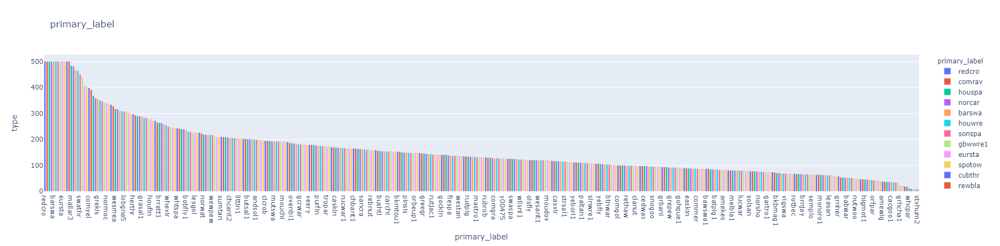

In [42]:
fig = px.bar(df_train_meta.groupby('primary_label', as_index=False).count()[["primary_label", "type"]].sort_values('type', ascending=False), x='primary_label', y='type', color="primary_label", title="primary_label")
fig.show()


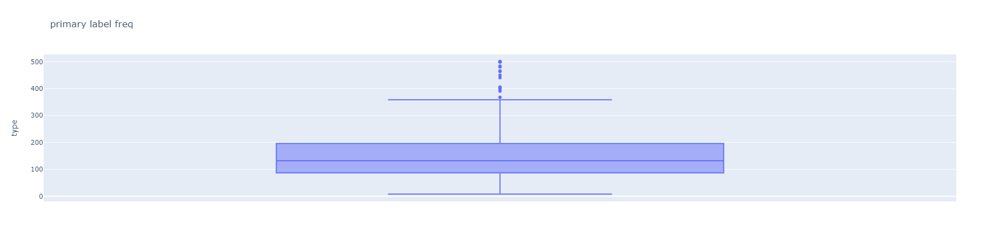

,type
count,397.000000
mean,158.372796
std,105.693535
min,8.000000
25%,87.000000
50%,132.000000
75%,196.000000
max,500.000000


In [8]:
# boxplot
fig = px.box(df_train_meta.groupby('primary_label', as_index=False).count()[["primary_label", "type"]].sort_values('type', ascending=False), y="type", width=600, title="primary label freq")
fig.show()

# primary Label statistic
display(df_train_meta.groupby('primary_label', as_index=False).count()[["primary_label", "type"]].sort_values('type', ascending=False).describe())


### Secondary Labels
- 欠損率65%
- あるのは21,516
- 大体1種類，多いのは16種類（外れ値）

In [9]:
# Missing Rate
print('Missing Rate', len(df_train_meta[df_train_meta["secondary_labels"] == "[]"]) / len(df_train_meta))
print('Total Num', len(df_train_meta))
print('Missing Num', len(df_train_meta[df_train_meta["secondary_labels"] == "[]"]))
print('Exsist Num', len(df_train_meta[df_train_meta["secondary_labels"] != "[]"]))

Missing Rate 0.6577917740242389
Total Num 62874
Missing Num 41358
Exsist Num 21516


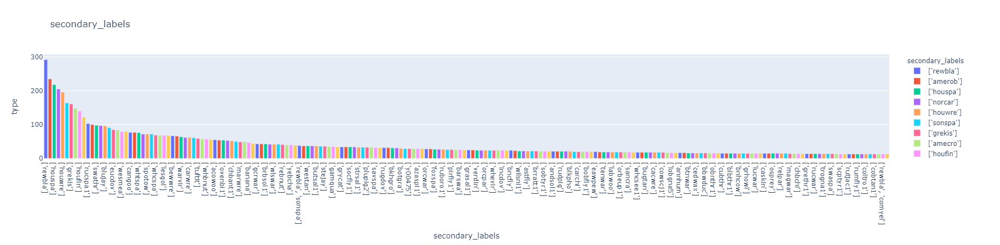

In [10]:
# fig = px.bar(df_train_meta[df_train_meta["secondary_labels"] != "[]"].groupby('secondary_labels', as_index=False).count()[["secondary_labels", "type"]].sort_values('type', ascending=False).head(200), x='secondary_labels', y='type', color="secondary_labels", title="secondary_labels")
fig = px.bar(df_train_meta[df_train_meta["secondary_labels"] != "[]"].groupby('secondary_labels', as_index=False).count()[["secondary_labels", "type"]].sort_values('type', ascending=False).head(200), x='secondary_labels', y='type', color="secondary_labels", title="secondary_labels")
fig.show()

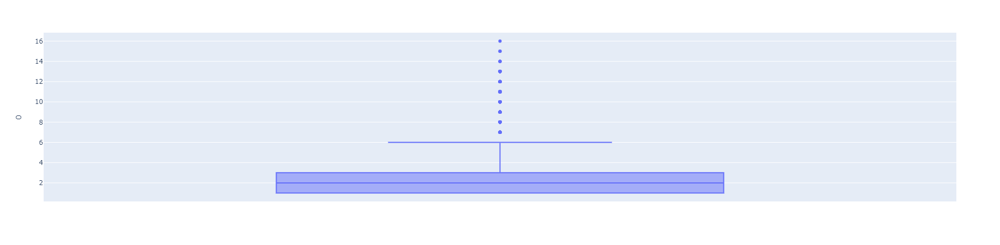

,0
count,21516.000000
mean,2.341699
std,1.729914
min,1.000000
25%,1.000000
50%,2.000000
75%,3.000000
max,16.000000


In [11]:
allCount = []
allBack = []
specs = []

# count
def countDuplicateBackgroundLabel(row):
    allBack.append(row.secondary_labels.replace("[", "").replace("]", "").replace("'", "").replace(" ", "").split(','))
    allCount.append(len(row.secondary_labels.replace("[", "").replace("]", "").replace("'", "").replace(" ", "").split(',')))

    for second in row.secondary_labels.replace("[", "").replace("]", "").replace("'", "").replace(" ", "").split(','):
        specs.append(second)
df_train_meta[df_train_meta["secondary_labels"] != "[]"].apply(countDuplicateBackgroundLabel, axis=1);

# boxplot
fig = px.box(pd.DataFrame(allCount), y=0)
fig.show()

# statistic
display(pd.DataFrame(allCount).describe())

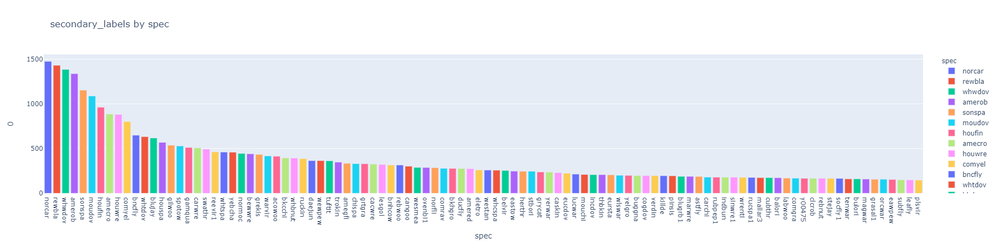

In [12]:
fig = px.bar(pd.DataFrame.from_dict({'spec': specs}).value_counts().reset_index().head(100), x='spec', y=0, color="spec", title="secondary_labels by spec")
fig.show()

### Author
- 欠損率0％

In [13]:
# missing rate
(df_train_meta.author == "").sum()

0

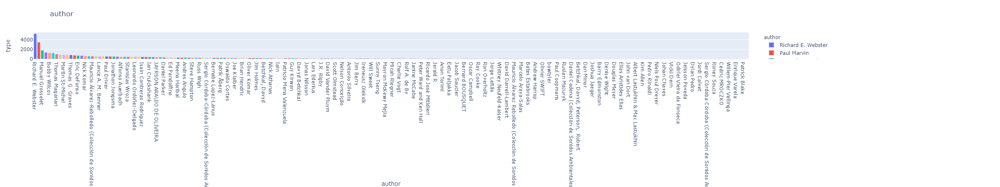

In [14]:
fig = px.bar(df_train_meta.groupby('author', as_index=False).count()[["author", "type"]].sort_values('type', ascending=False).head(200), x='author', y='type', color="author", title="author")
fig.show()

### Date

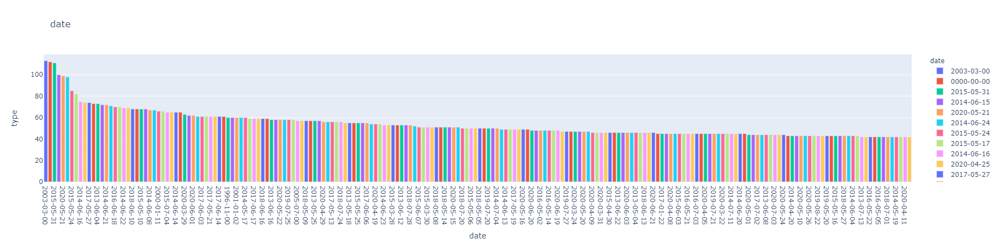

In [15]:
# no missing value
# summary
fig = px.bar(df_train_meta.groupby('date', as_index=False).count()[["date", "type"]].sort_values('type', ascending=False).head(200), x='date', y='type', color="date", title="date")
fig.show()

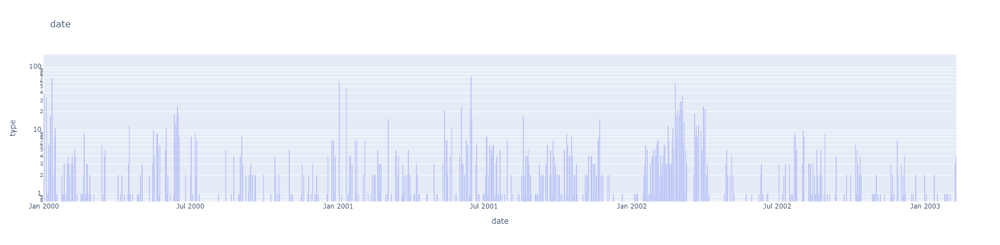

In [60]:
fig = px.bar(df_train_meta[df_train_meta["date"] > "2000-00-00"].groupby('date', as_index=False).count()[["date", "type"]].sort_values("date").head(500), x='date', y='type', title="date(log scale)")
fig.update_yaxes(type="log")
fig.show()

### Rating

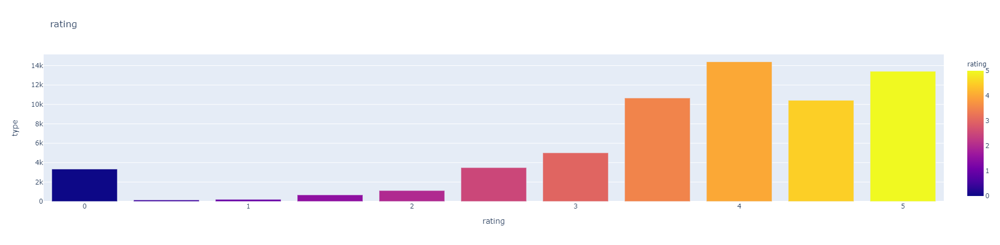

In [17]:
# there are no missing values
fig = px.bar(df_train_meta.groupby('rating', as_index=False).count()[["rating", "type"]].sort_values('type', ascending=False).head(200), x='rating', y='type', color="rating", title="rating", width=1000)
fig.show()

### Time

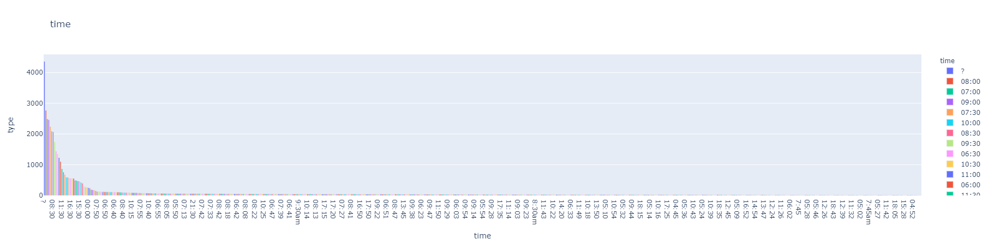

In [18]:
# there are no missing values
fig = px.bar(df_train_meta.groupby('time', as_index=False).count()[["time", "type"]].sort_values('type', ascending=False).head(600), x='time', y='type', color="time", title="time")
fig.show()

## Geo

In [19]:
df_train_meta.head(1)

,primary_label,secondary_labels,type,latitude,longitude,scientific_name,common_name,author,date,filename,license,rating,time,url
0,acafly,['amegfi'],"['begging call', 'call', 'juvenile']",35.386,-84.125,Empidonax virescens,Acadian Flycatcher,Mike Nelson,2012-08-12,XC109605.ogg,Creative Commons Attribution-NonCommercial-Sha...,2.5,09:30,https://www.xeno-canto.org/109605


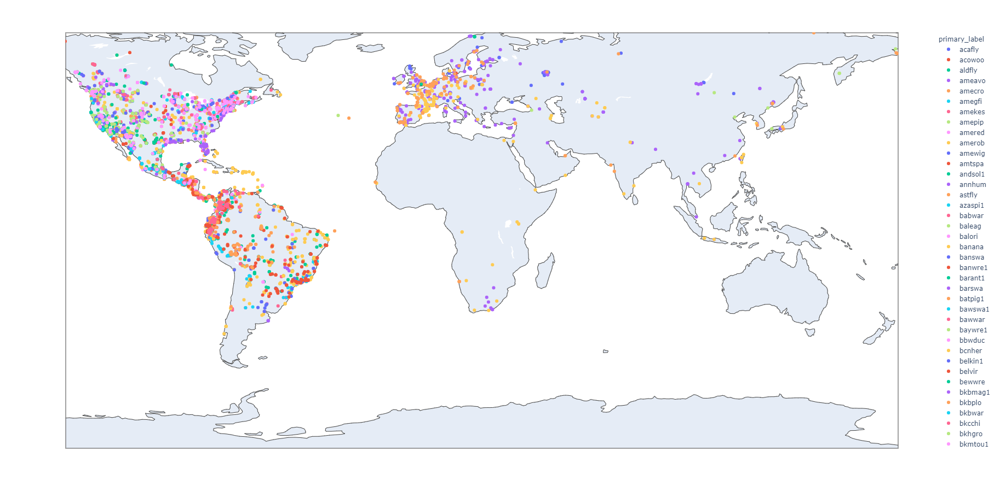

In [20]:
# import geopandas as gpd
# geo_df = gpd.read_file(gpd.datasets.get_path('naturalearth_cities'))
# px.set_mapbox_access_token(open(".mapbox_token").read())
fig = px.scatter_geo(df_train_meta.head(10000),
                    lat="latitude",
                    lon="longitude",
                    hover_name="primary_label",
                    width=1600,
                    height=900,
                    color="primary_label")
fig.show()

## Colleration

In [21]:
import itertools
from collections import Counter

## Duration

In [34]:
df_train_meta.describe()

,latitude,longitude,rating,duration
count,62874.000000,62874.000000,62874.000000,62874.000000
mean,24.472805,-79.960828,3.755360,56.255305
std,22.108481,38.370726,1.220135,74.042363
min,-53.162000,-165.781200,0.000000,5.958125
25%,6.246000,-108.976100,3.500000,18.378250
50%,31.741400,-81.553400,4.000000,34.260688
75%,41.198700,-73.133333,4.500000,66.205000
max,78.928100,179.360700,5.000000,2745.352937


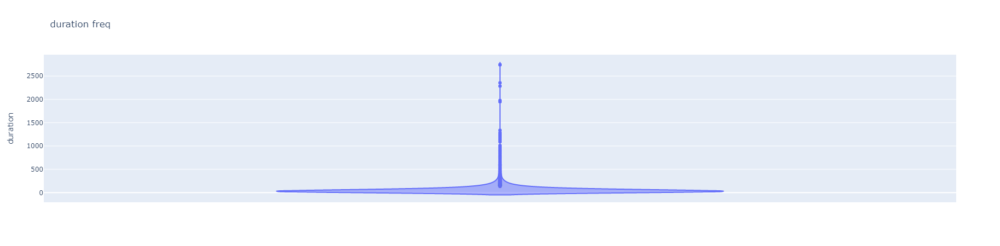

In [37]:
fig = px.violin(df_train_meta, y="duration", width=400, title="duration freq")
fig.show()

# Train Soundscape

## Statistic

In [44]:
df_train_soundscape

,row_id,site,audio_id,seconds,birds
0,7019_COR_5,COR,7019,5,nocall
1,7019_COR_10,COR,7019,10,nocall
2,7019_COR_15,COR,7019,15,nocall
3,7019_COR_20,COR,7019,20,nocall
4,7019_COR_25,COR,7019,25,nocall
...,...,...,...,...,...
2395,54955_SSW_580,SSW,54955,580,nocall
2396,54955_SSW_585,SSW,54955,585,grycat
2397,54955_SSW_590,SSW,54955,590,grycat
2398,54955_SSW_595,SSW,54955,595,nocall


In [49]:
display(df_train_soundscape.site.value_counts())
display(df_train_soundscape.audio_id.value_counts())

SSW    1200
COR    1200
Name: site, dtype: int64

42907    120
7954     120
14473    120
57610    120
7019     120
7843     120
50878    120
51010    120
44957    120
26746    120
28933    120
10534    120
2782     120
11254    120
31928    120
21767    120
18003    120
54955    120
20152    120
26709    120
Name: audio_id, dtype: int64

## Birds

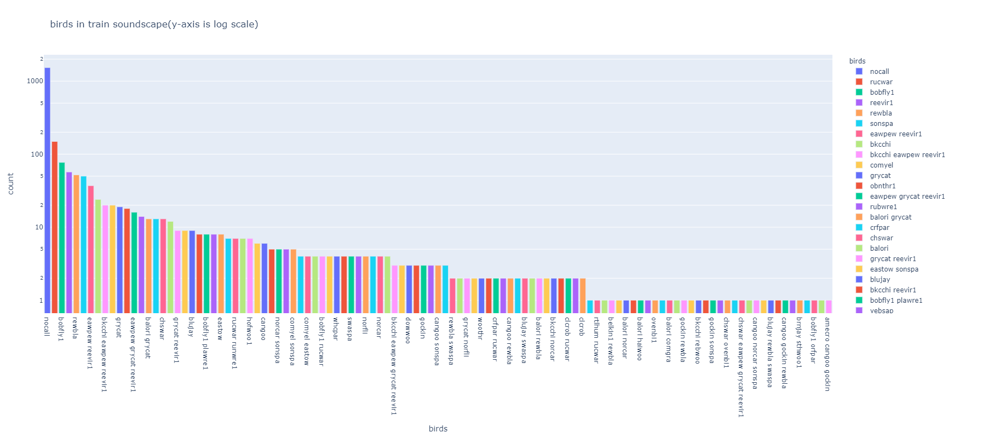

In [59]:
# summary
fig = px.bar(df_train_soundscape.groupby('birds', as_index=False).count()[["birds", "row_id"]].rename(columns={"row_id": "count"}).sort_values('count', ascending=False), x='birds', y='count', color="birds", title="birds in train soundscape(y-axis is log scale)", height=800)
fig.update_yaxes(type="log")
fig.show()

## Duration

In [62]:
df_train_soundscape

,row_id,site,audio_id,seconds,birds
0,7019_COR_5,COR,7019,5,nocall
1,7019_COR_10,COR,7019,10,nocall
2,7019_COR_15,COR,7019,15,nocall
3,7019_COR_20,COR,7019,20,nocall
4,7019_COR_25,COR,7019,25,nocall
...,...,...,...,...,...
2395,54955_SSW_580,SSW,54955,580,nocall
2396,54955_SSW_585,SSW,54955,585,grycat
2397,54955_SSW_590,SSW,54955,590,grycat
2398,54955_SSW_595,SSW,54955,595,nocall


In [69]:
import glob

files = glob.glob(str(ROOT_DIR_TRAIN_SOUNDSCAPE) + "/*")
for file in files:
    print(file)

..\input\train_soundscapes\10534_SSW_20170429.ogg
..\input\train_soundscapes\11254_COR_20190904.ogg
..\input\train_soundscapes\14473_SSW_20170701.ogg
..\input\train_soundscapes\18003_COR_20190904.ogg
..\input\train_soundscapes\20152_SSW_20170805.ogg
..\input\train_soundscapes\21767_COR_20190904.ogg
..\input\train_soundscapes\26709_SSW_20170701.ogg
..\input\train_soundscapes\26746_COR_20191004.ogg
..\input\train_soundscapes\2782_SSW_20170701.ogg
..\input\train_soundscapes\28933_SSW_20170408.ogg
..\input\train_soundscapes\31928_COR_20191004.ogg
..\input\train_soundscapes\42907_SSW_20170708.ogg
..\input\train_soundscapes\44957_COR_20190923.ogg
..\input\train_soundscapes\50878_COR_20191004.ogg
..\input\train_soundscapes\51010_SSW_20170513.ogg
..\input\train_soundscapes\54955_SSW_20170617.ogg
..\input\train_soundscapes\57610_COR_20190904.ogg
..\input\train_soundscapes\7019_COR_20190904.ogg
..\input\train_soundscapes\7843_SSW_20170325.ogg
..\input\train_soundscapes\7954_COR_20190923.ogg


In [79]:
# # prep
# durations = []
# filenames = []
# sites = []
# audio_ids = []
# dates = []
# files = glob.glob(str(ROOT_DIR_TRAIN_SOUNDSCAPE) + "/*")
# for file in files:
#     audio, duration = read_audio(Path(file), config)
    
#     durations.append(duration / config.sampling_rate)
#     filenames.append(Path(file).name)
#     sites.append(Path(file).name.split("_")[1])
#     audio_ids.append(Path(file).name.split("_")[0])
#     dates.append(Path(file).name.split("_")[2].replace(".ogg", ""))

In [82]:
# pd.DataFrame.from_dict({
#     "filename": filenames,
#     "site": sites,
#     "audio_id": audio_ids,
#     "date": dates,
#     "duration": durations}).to_csv('../input/train_soundscape_prep.csv', index=False)

In [84]:
pd.read_csv('../input/train_soundscape_prep.csv')

,filename,site,audio_id,date,duration
0,10534_SSW_20170429.ogg,SSW,10534,20170429,600.0
1,11254_COR_20190904.ogg,COR,11254,20190904,600.0
2,14473_SSW_20170701.ogg,SSW,14473,20170701,600.0
3,18003_COR_20190904.ogg,COR,18003,20190904,600.0
4,20152_SSW_20170805.ogg,SSW,20152,20170805,600.0
5,21767_COR_20190904.ogg,COR,21767,20190904,600.0
6,26709_SSW_20170701.ogg,SSW,26709,20170701,600.0
7,26746_COR_20191004.ogg,COR,26746,20191004,600.0
8,2782_SSW_20170701.ogg,SSW,2782,20170701,600.0
9,28933_SSW_20170408.ogg,SSW,28933,20170408,600.0


# Test
- 4つの録音場所，それぞれ10分間にわたって録音された20のサウンドスケープ？
- 合計，20 * 4 = 80ってことか？

# Audio

### Train short audio

In [22]:
# sample
XC6671, rate = librosa.load('../input/train_short_audio/acafly/XC6671.ogg', sr=config.sampling_rate)
ipD.Audio(XC6671, rate=rate)

In [23]:
# primary label
print(df_train_meta.values[0][0])

# filename
print(df_train_meta.values[0][9])

acafly
XC109605.ogg


duration 77.125
row ['yetvir' "['gamqua', 'whwdov']" "['adult', 'male', 'song']" 31.906
 -109.1543 'Vireo flavifrons' 'Yellow-throated Vireo' 'Richard E. Webster'
 '2020-05-26' 'XC615888.ogg'
 'Creative Commons Attribution-NonCommercial-ShareAlike 4.0' 4.5 '06:23'
 'https://www.xeno-canto.org/615888']


C:\Users\tatsuya.takahashi\anaconda3\lib\site-packages\librosa\display.py:974: MatplotlibDeprecationWarning:

The 'basey' parameter of __init__() has been renamed 'base' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.

C:\Users\tatsuya.takahashi\anaconda3\lib\site-packages\librosa\display.py:974: MatplotlibDeprecationWarning:

The 'linthreshy' parameter of __init__() has been renamed 'linthresh' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.



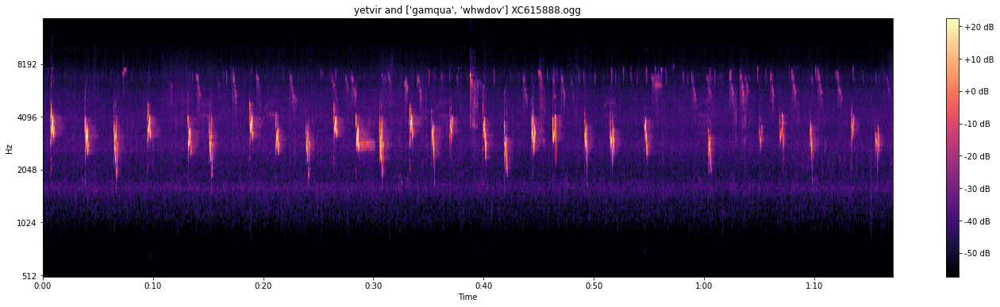

In [25]:
audio, duration = read_audio(ROOT_DIR_TRAIN / species / filename, config)
print("duration", duration / config.sampling_rate)
print("row", row)
melspec = audio_to_melspectrogram(audio, config)
show_melspectrogram(melspec, config, species + " and " + row[1] + " " + filename)
ipD.Audio(audio, rate=config.sampling_rate)

### Train soundscape

In [85]:
# latitude, longitude
COL = [5.57,-75.85,200,'Jardín, Departamento de Antioquia','Colombia']
COR = [10.12,-84.51,200,'Alajuela, San Ramón','Costa Rica']
SNE = [38.49,-119.95,200,'Sierra Nevada, California','USA'] 
SSW = [42.47,-76.45,200,'Ithaca, New York','USA']
index = ['COL','COR','SNE','SSW']
columns = ['latitude','longitude','size','location','country']
data = [COL,COR,SNE,SSW]
test_tdf = pd.DataFrame(data,index=index,columns=columns)
test_tdf

,latitude,longitude,size,location,country
COL,5.57,-75.85,200,"Jardín, Departamento de Antioquia",Colombia
COR,10.12,-84.51,200,"Alajuela, San Ramón",Costa Rica
SNE,38.49,-119.95,200,"Sierra Nevada, California",USA
SSW,42.47,-76.45,200,"Ithaca, New York",USA


## Train Soundscape